# ***Project Name*** - Explainable AI for Medical Image Segmentation Using **Grad-CAM**

## **Group - 2**
## **Team Members -**


### 1.   Srirama Rama Sai Mehar
### 2.   Himanshi Agarwal
### 3.   Sai Sumanth V



## **Loading Dataset**

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"saisumanthvandamasu","key":"f56d5e26bc565972cf891cb00b2b04bc"}'}

In [ ]:
!kaggle datasets download -d abdallahwagih/kvasir-dataset-for-classification-and-segmentation

Dataset URL: https://www.kaggle.com/datasets/abdallahwagih/kvasir-dataset-for-classification-and-segmentation
License(s): CC0-1.0
100% 1.20G/1.20G [01:08<00:00, 21.9MB/s]
100% 1.20G/1.20G [01:08<00:00, 18.7MB/s]


In [ ]:
!unzip /content/kvasir-dataset-for-classification-and-segmentation.zip

Streaming output truncated to the last 5000 lines.
  inflating: kvasir-dataset/kvasir-dataset/esophagitis/00687a70-bbad-4bf9-864f-9f7b3c27a2c8.jpg  
  inflating: kvasir-dataset/kvasir-dataset/esophagitis/0134d93d-0922-4063-9acd-a4177f2b0c07.jpg  
  inflating: kvasir-dataset/kvasir-dataset/esophagitis/01a57b1a-780f-4e52-9f94-291c2982154d.jpg  
  inflating: kvasir-dataset/kvasir-dataset/esophagitis/01f092a2-fccb-49f6-af06-8351c8bb47f1.jpg  
  inflating: kvasir-dataset/kvasir-dataset/esophagitis/022b40a7-a36f-4510-95a1-b6bb709e94ed.jpg  
  inflating: kvasir-dataset/kvasir-dataset/esophagitis/02b1d319-dea6-418b-969a-c588585cb4f2.jpg  
  inflating: kvasir-dataset/kvasir-dataset/esophagitis/02de4b4c-8704-45f7-b90f-6004d76bdded.jpg  
  inflating: kvasir-dataset/kvasir-dataset/esophagitis/0339a2f7-65bb-41fb-8650-e119670b4e2e.jpg  
  inflating: kvasir-dataset/kvasir-dataset/esophagitis/03ccdf30-eac8-4e3b-b8e5-54fbf64709dd.jpg  
  inflating: kvasir-dataset/kvasir-dataset/esophagitis/03ea76c5-d60

## **Importing Libraries**

In [ ]:
# importing system libraries
import os
import time
import random
import pathlib
import itertools
from glob import glob
from tqdm import tqdm_notebook, tnrange
from PIL import Image

# importing data handling tools
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
%matplotlib inline
from skimage.color import rgb2gray
from skimage.morphology import label
from skimage.transform import resize
from sklearn.model_selection import train_test_split
from skimage.io import imread, imshow, concatenate_images

# importing Deep learning Libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model, load_model, save_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.layers import Input, Activation, BatchNormalization, Dropout, Lambda, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate

# Ignore Warnings
import warnings
warnings.filterwarnings("ignore")

print ('modules loaded')

modules loaded


In [ ]:
IMG_CHANNELS, IMG_WIDTH, IMG_HEIGHT = 3, 512, 512

 Getting name of image files and appending it to a list.

In [ ]:
X = next(os.walk('/content/kvasir-seg/Kvasir-SEG/images'))[2]
y = next(os.walk('/content/kvasir-seg/Kvasir-SEG/masks'))[2]

In [ ]:
X_ids = X[:-10]
y_ids = y[:-10]

In [ ]:
X_tr = np.zeros((len(X_ids), 256, 256, 3), dtype=np.float32)
y_tr = np.zeros((len(y_ids), 256, 256, 1), dtype=np.bool_)

## **Pre-Processing**

In [ ]:
X_train = np.zeros((len(X_ids), 256, 256, 3), dtype=np.float32)
y_train = np.zeros((len(y_ids), 256, 256, 1), dtype=np.bool_)

for n, id_ in enumerate(X_ids):
    image = tf.keras.preprocessing.image.load_img(f'/content/kvasir-seg/Kvasir-SEG/images/{id_}', target_size=(IMG_HEIGHT, IMG_WIDTH))
    input_arr = tf.keras.preprocessing.image.img_to_array(image)[90:450,150:406]
    image = tf.keras.preprocessing.image.array_to_img(input_arr, ).resize((256, 256))
    X_train[n] = np.array(image)

for n, id_ in enumerate(y_ids):
    image = tf.keras.preprocessing.image.load_img(f'/content/kvasir-seg/Kvasir-SEG/masks/{id_}',
                                                  target_size=(IMG_HEIGHT, IMG_WIDTH), color_mode="grayscale")
    input_arr = tf.keras.preprocessing.image.img_to_array(image)[90:450,150:406]
    image = tf.keras.preprocessing.image.array_to_img(input_arr).resize((256, 256))
    y_train[n] = np.array(image)[:, :, np.newaxis]

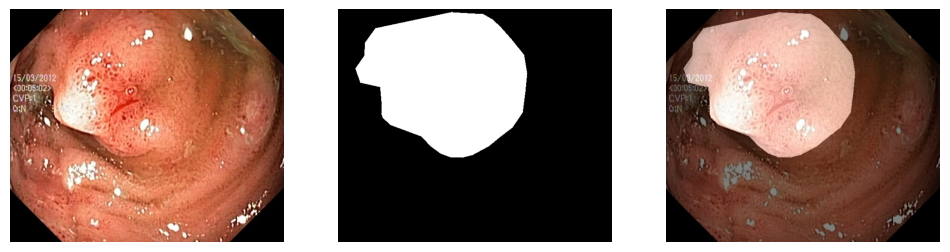

In [ ]:
plt.figure(figsize=(12, 8))
img=cv2.imread('/content/kvasir-seg/Kvasir-SEG/images/cju0qkwl35piu0993l0dewei2.jpg')
msk=cv2.imread('/content/kvasir-seg/Kvasir-SEG/masks/cju0qkwl35piu0993l0dewei2.jpg')

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis(False)

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(msk, cv2.COLOR_BGR2RGB))
plt.axis(False)

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.imshow(cv2.cvtColor(msk, cv2.COLOR_BGR2RGB),alpha=0.5)
plt.axis(False)
plt.show()

## **MODEL**

### *The architecture shown is the base architecture taken as reference in developing the model*

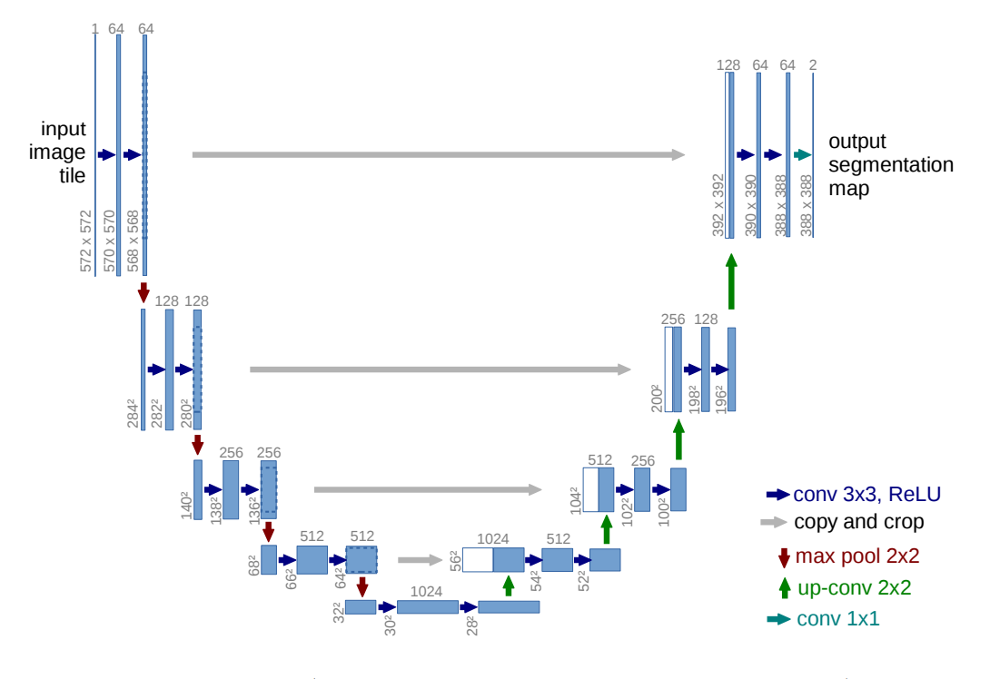

## **UNet model for image segmentation**

In [ ]:
def unet(input_size=(256, 256, 3)):
    inputs = Input(input_size)
    #Encoder
    conv1 = Conv2D(filters=64, kernel_size=(3, 3), padding="same")(inputs)
    bn1 = Activation("relu")(conv1)
    conv1 = Conv2D(filters=64, kernel_size=(3, 3), padding="same")(bn1)
    bn1 = BatchNormalization(axis=3)(conv1)
    bn1 = Activation("relu")(bn1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(bn1)

    conv2 = Conv2D(filters=128, kernel_size=(3, 3), padding="same")(pool1)
    bn2 = Activation("relu")(conv2)
    conv2 = Conv2D(filters=128, kernel_size=(3, 3), padding="same")(bn2)
    bn2 = BatchNormalization(axis=3)(conv2)
    bn2 = Activation("relu")(bn2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(bn2)

    conv3 = Conv2D(filters=256, kernel_size=(3, 3), padding="same")(pool2)
    bn3 = Activation("relu")(conv3)
    conv3 = Conv2D(filters=256, kernel_size=(3, 3), padding="same")(bn3)
    bn3 = BatchNormalization(axis=3)(conv3)
    bn3 = Activation("relu")(bn3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(bn3)

    conv4 = Conv2D(filters=512, kernel_size=(3, 3), padding="same")(pool3)
    bn4 = Activation("relu")(conv4)
    conv4 = Conv2D(filters=512, kernel_size=(3, 3), padding="same")(bn4)
    bn4 = BatchNormalization(axis=3)(conv4)
    bn4 = Activation("relu")(bn4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(bn4)

    conv5 = Conv2D(filters=1024, kernel_size=(3, 3), padding="same")(pool4)
    bn5 = Activation("relu")(conv5)
    conv5 = Conv2D(filters=1024, kernel_size=(3, 3), padding="same")(bn5)
    bn5 = BatchNormalization(axis=3)(conv5)
    bn5 = Activation("relu")(bn5)

    #Decoder

    up6 = concatenate([Conv2DTranspose(512, kernel_size=(2, 2), strides=(2, 2), padding="same")(bn5), conv4], axis=3)
    conv6 = Conv2D(filters=512, kernel_size=(3, 3), padding="same")(up6)
    bn6 = Activation("relu")(conv6)
    conv6 = Conv2D(filters=512, kernel_size=(3, 3), padding="same")(bn6)
    bn6 = BatchNormalization(axis=3)(conv6)
    bn6 = Activation("relu")(bn6)

    up7 = concatenate([Conv2DTranspose(256, kernel_size=(2, 2), strides=(2, 2), padding="same")(bn6), conv3], axis=3)
    conv7 = Conv2D(filters=256, kernel_size=(3, 3), padding="same")(up7)
    bn7 = Activation("relu")(conv7)
    conv7 = Conv2D(filters=256, kernel_size=(3, 3), padding="same")(bn7)
    bn7 = BatchNormalization(axis=3)(conv7)
    bn7 = Activation("relu")(bn7)

    up8 = concatenate([Conv2DTranspose(128, kernel_size=(2, 2), strides=(2, 2), padding="same")(bn7), conv2], axis=3)
    conv8 = Conv2D(filters=128, kernel_size=(3, 3), padding="same")(up8)
    bn8 = Activation("relu")(conv8)
    conv8 = Conv2D(filters=128, kernel_size=(3, 3), padding="same")(bn8)
    bn8 = BatchNormalization(axis=3)(conv8)
    bn8 = Activation("relu")(bn8)

    up9 = concatenate([Conv2DTranspose(64, kernel_size=(2, 2), strides=(2, 2), padding="same")(bn8), conv1], axis=3)
    conv9 = Conv2D(filters=64, kernel_size=(3, 3), padding="same")(up9)
    bn9 = Activation("relu")(conv9)
    conv9 = Conv2D(filters=64, kernel_size=(3, 3), padding="same")(bn9)
    bn9 = BatchNormalization(axis=3)(conv9)
    bn9 = Activation("relu")(bn9)

    conv10 = Conv2D(filters=1, kernel_size=(1, 1), activation="sigmoid")(bn9)

    return Model(inputs=[inputs], outputs=[conv10])

In [ ]:
# function to create dice coefficient
def dice_coef(y_true, y_pred, smooth=1):
    y_true_flatten = K.cast(K.flatten(y_true), 'float32')  # Cast y_true to float32
    y_pred_flatten = K.cast(K.flatten(y_pred), 'float32')  # Cast y_pred to float32

    intersection = K.sum(y_true_flatten * y_pred_flatten)
    union = K.sum(y_true_flatten) + K.sum(y_pred_flatten)

    return (2 * intersection + smooth) / (union + smooth)


# function to create dice loss
def dice_loss(y_true, y_pred, smooth=100):
    return -dice_coef(y_true, y_pred, smooth)

# function to create iou coefficient
def iou_coef(y_true, y_pred, smooth=100):
    y_true = K.cast(y_true, dtype='float32')  # Convert y_true to float32
    y_pred = K.cast(y_pred, dtype='float32')  # Convert y_pred to float32
    intersection = K.sum(y_true * y_pred)
    sum = K.sum(y_true + y_pred)
    iou = (intersection + smooth) / (sum - intersection + smooth)
    return iou

The Dice Coefficient measures the similarity between two sets, commonly used to evaluate the overlap between the predicted segmentation (y_pred) and the ground truth (y_true). It ranges from 0 (no overlap) to 1 (perfect overlap).



Dice Loss is derived directly from the Dice Coefficient and is used as a loss function during model training. The goal is to minimize this loss, which corresponds to maximizing the Dice Coefficient.



The Intersection over Union (IoU) Coefficient, also known as the Jaccard Index, measures the overlap between two sets. It's a common evaluation metric for segmentation tasks, indicating how well the predicted segmentation matches the ground truth.





In [ ]:
model = unet()
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy', iou_coef, dice_coef])
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 256, 256, 64)   │          1,792 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 256, 256, 64)   │              0 │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 256, 256, 64)   │         36,928 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 256, 256, 64)   │            256 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 256, 256, 64)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 128, 128, 64)   │              0 │ activation_1[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 128, 128, 128)  │         73,856 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 128, 128, 128)  │              0 │ conv2d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 128, 128, 128)  │        147,584 │ activation_2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 128, 128, 128)  │            512 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 128, 128, 128)  │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 64, 64, 128)    │              0 │ activation_3[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 64, 64, 256)    │        295,168 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_4 (Activation) │ (None, 64, 64, 256)    │              0 │ conv2d_4[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 64, 64, 256)    │        590,080 │ activation_4[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 64, 64, 256)    │          1,024 │ conv2d_5[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├──────────────────────

 Total params: 31,043,521 (118.42 MB)

 Trainable params: 31,037,633 (118.40 MB)

 Non-trainable params: 5,888 (23.00 KB)

## **Training the model**

In [ ]:
history = model.fit(X_train, y_train, validation_split=0.1, batch_size=16, epochs=100)

Epoch 1/100
56/56 ━━━━━━━━━━━━━━━━━━━━ 226s 3s/step - accuracy: 0.6545 - dice_coef: 0.4028 - iou_coef: 0.2536 - loss: 0.5984 - val_accuracy: 0.5519 - val_dice_coef: 0.3509 - val_iou_coef: 0.2154 - val_loss: 6.7198
Epoch 2/100
56/56 ━━━━━━━━━━━━━━━━━━━━ 91s 809ms/step - accuracy: 0.7181 - dice_coef: 0.4324 - iou_coef: 0.2765 - loss: 0.5319 - val_accuracy: 0.3215 - val_dice_coef: 0.4702 - val_iou_coef: 0.3115 - val_loss: 14.8952
Epoch 3/100
56/56 ━━━━━━━━━━━━━━━━━━━━ 82s 806ms/step - accuracy: 0.7402 - dice_coef: 0.4387 - iou_coef: 0.2821 - loss: 0.5140 - val_accuracy: 0.7066 - val_dice_coef: 0.3567 - val_iou_coef: 0.2191 - val_loss: 0.5973
Epoch 4/100
56/56 ━━━━━━━━━━━━━━━━━━━━ 82s 807ms/step - accuracy: 0.7404 - dice_coef: 0.4492 - iou_coef: 0.2905 - loss: 0.5157 - val_accuracy: 0.5632 - val_dice_coef: 0.5260 - val_iou_coef: 0.3615 - val_loss: 1.3036
Epoch 5/100
56/56 ━━━━━━━━━━━━━━━━━━━━ 82s 806ms/step - accuracy: 0.7557 - dice_coef: 0.4446 - iou_coef: 0.2875 - loss: 0.4890 - val_accu

### **Plotting history:**

In [ ]:
def plot_training(hist):


    # Defining  variables
    tr_acc = hist.history['accuracy']
    tr_iou = hist.history['iou_coef']
    tr_dice = hist.history['dice_coef']
    tr_loss = hist.history['loss']

    val_acc = hist.history['val_accuracy']
    val_iou = hist.history['val_iou_coef']
    val_dice = hist.history['val_dice_coef']
    val_loss = hist.history['val_loss']

    index_acc = np.argmax(val_acc)
    acc_highest = val_acc[index_acc]
    index_iou = np.argmax(iou_coef)
    iou_highest = val_iou[index_iou]
    index_dice = np.argmax(dice_coef)
    dice_highest = val_dice[index_dice]
    index_loss = np.argmin(val_loss)
    val_lowest = val_loss[index_loss]

    Epochs = [i+1 for i in range(len(tr_acc))]

    acc_label = f'best epoch= {str(index_acc + 1)}'
    iou_label = f'best epoch= {str(index_iou + 1)}'
    dice_label = f'best epoch= {str(index_dice + 1)}'
    loss_label = f'best epoch= {str(index_loss + 1)}'

    # Plot training history
    plt.figure(figsize= (20, 20))
    plt.style.use('fivethirtyeight')

    # Training Accuracy
    plt.subplot(2, 2, 1)
    plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
    plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
    plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Training IoU
    plt.subplot(2, 2, 2)
    plt.plot(Epochs, tr_iou, 'r', label= 'Training IoU')
    plt.plot(Epochs, val_iou, 'g', label= 'Validation IoU')
    plt.scatter(index_iou + 1 , iou_highest, s= 150, c= 'blue', label= iou_label)
    plt.title('Training and Validation IoU Coefficient')
    plt.xlabel('Epochs')
    plt.ylabel('IoU')
    plt.legend()

    # Training Dice
    plt.subplot(2, 2, 3)
    plt.plot(Epochs, tr_dice, 'r', label= 'Training Dice')
    plt.plot(Epochs, val_dice, 'g', label= 'Validation Dice')
    plt.scatter(index_dice + 1 , dice_highest, s= 150, c= 'blue', label= dice_label)
    plt.title('Training and Validation Dice Coefficient')
    plt.xlabel('Epochs')
    plt.ylabel('Dice')
    plt.legend()

    # Training Loss
    plt.subplot(2, 2, 4)
    plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
    plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
    plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout
    plt.show()

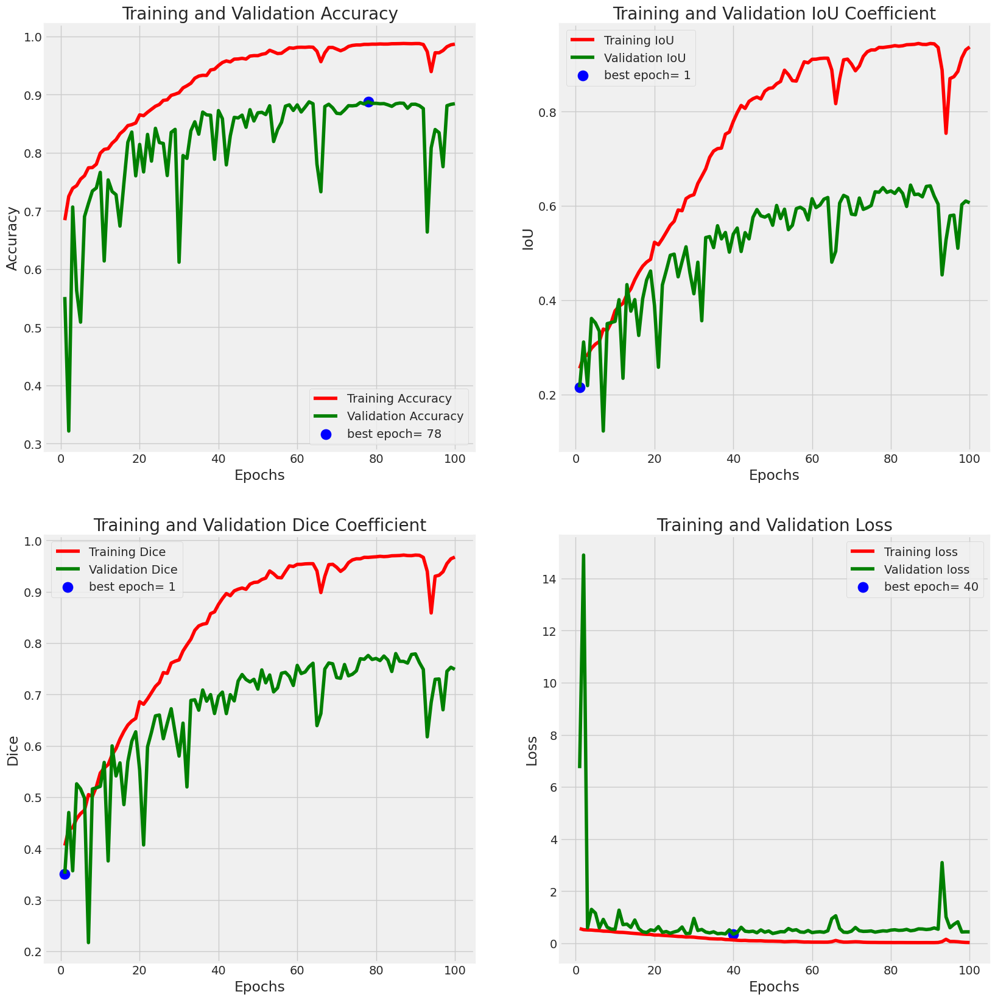

In [ ]:
plot_training(history)

## **Predicted Image**

In [ ]:
img = tf.keras.preprocessing.image.load_img(r"/content/kvasir-seg/Kvasir-SEG/images/cju0s2a9ekvms080138tjjpxr.jpg", target_size=(256, 256))
input_array = tf.keras.preprocessing.image.img_to_array(img)
input_array = np.array([input_array])  # Convert single image to a batch.
predictions = model.predict(input_array)

1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step


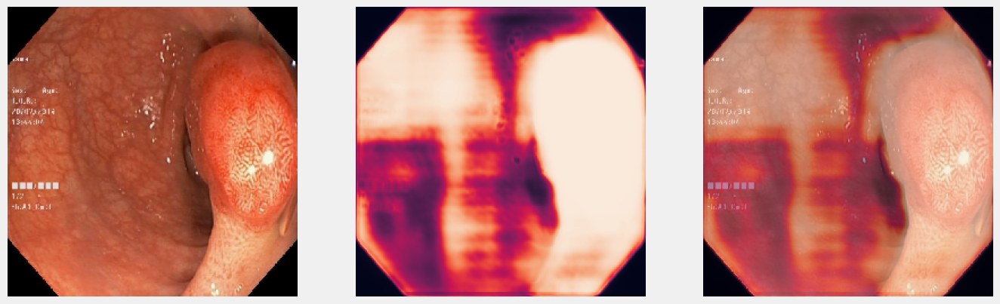

In [ ]:
plt.figure(figsize=(15, 12))
plt.subplot(1, 3, 1)
plt.imshow(np.squeeze(img))
plt.axis(False)
plt.subplot(1, 3, 2)
plt.imshow(np.squeeze(predictions))
plt.axis(False)
plt.subplot(1, 3, 3)
plt.imshow(np.squeeze(img))
# plt.imshow(msk,alpha=0.5)
plt.imshow(np.squeeze(predictions), alpha=0.5)
plt.axis(False)
plt.show()

In [ ]:
subject = 'Kvasir Segmentation'
save_path = './'


save_id = str(f'{subject} model.h5')
model_save_loc = os.path.join(save_path, save_id)
model.save(model_save_loc)
print(f'model was saved as {model_save_loc}')

model was saved as ./Kvasir Segmentation model.h5


## **Model Testing**

In [ ]:
# function to create dice coefficient
def dice_coef(y_true, y_pred, smooth=1):
    y_true_flatten = K.cast(K.flatten(y_true), 'float32')
    y_pred_flatten = K.cast(K.flatten(y_pred), 'float32')

    intersection = K.sum(y_true_flatten * y_pred_flatten)
    union = K.sum(y_true_flatten) + K.sum(y_pred_flatten)

    return (2 * intersection + smooth) / (union + smooth)


# function to create dice loss
def dice_loss(y_true, y_pred, smooth=100):
    return -dice_coef(y_true, y_pred, smooth)

# function to create iou coefficient
def iou_coef(y_true, y_pred, smooth=100):
    y_true = K.cast(y_true, dtype='float32')
    y_pred = K.cast(y_pred, dtype='float32')
    intersection = K.sum(y_true * y_pred)
    sum = K.sum(y_true + y_pred)
    iou = (intersection + smooth) / (sum - intersection + smooth)
    return iou

In [ ]:
segmentation_model = load_model('Kvasir Segmentation model.h5', compile=False)
segmentation_model.compile(Adamax(learning_rate=0.001), loss=dice_loss, metrics=['accuracy', iou_coef, dice_coef])

In [ ]:
# Preprocess the image for segmentation
def preprocess_segmentation_image(image):
    img_array = tf.keras.preprocessing.image.img_to_array(image)
    image = cv2.cvtColor(img_array, cv2.COLOR_RGB2BGR)
    img = cv2.resize(image, (256, 256))
    img = img / 255
    img = img[np.newaxis, :, :, :]

In [ ]:
img = tf.keras.preprocessing.image.load_img(r"/content/gu1.jpg", target_size=(256, 256))
input_array = tf.keras.preprocessing.image.img_to_array(img)
input_array = np.array([input_array])  # Converting image to a batch.
predictions = segmentation_model.predict(input_array)

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


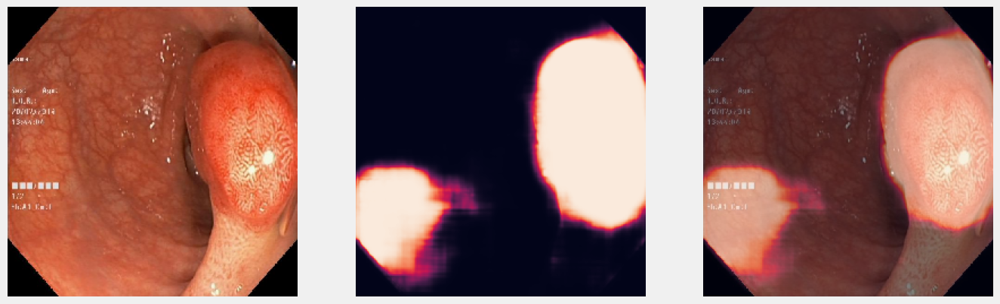

In [ ]:
plt.figure(figsize=(15, 12))
plt.subplot(1, 3, 1)
plt.imshow(np.squeeze(img))
plt.axis(False)
plt.subplot(1, 3, 2)
plt.imshow(np.squeeze(predictions))
plt.axis(False)
plt.subplot(1, 3, 3)
plt.imshow(np.squeeze(img))
plt.imshow(np.squeeze(predictions), alpha=0.5)
plt.axis(False)
plt.show()

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
import random

# Function to load and preprocess a single image
def load_and_preprocess_image(filepath, target_size=(256, 256)):
    img = tf.keras.preprocessing.image.load_img(filepath, target_size=target_size)
    input_array = tf.keras.preprocessing.image.img_to_array(img)
    input_array = np.expand_dims(input_array, axis=0)  # Convert to a batch of 1
    return img, input_array

# Path to the images folder
images_folder = "/content/kvasir-seg/Kvasir-SEG/images/"
all_images = os.listdir(images_folder)

# Select 10-15 random images
num_images = 15  # Change this to your desired number
random_images = random.sample(all_images, num_images)

# Set up the plot grid
plt.figure(figsize=(20, num_images * 4))
for i, image_name in enumerate(random_images):
    image_path = os.path.join(images_folder, image_name)

    # Load and preprocess the image
    original_img, input_array = load_and_preprocess_image(image_path)

    # Get the model prediction
    predictions = segmentation_model.predict(input_array)
    predicted_mask = np.squeeze(predictions)

    # Plot original image
    plt.subplot(num_images, 3, i * 3 + 1)
    plt.imshow(original_img)
    plt.axis("off")
    plt.title("Original Image")

    # Plot prediction mask
    plt.subplot(num_images, 3, i * 3 + 2)
    plt.imshow(predicted_mask, cmap="gray")
    plt.axis("off")
    plt.title("Predicted Mask")

    # Overlay prediction on original
    plt.subplot(num_images, 3, i * 3 + 3)
    plt.imshow(original_img)
    plt.imshow(predicted_mask, cmap="jet", alpha=0.5)
    plt.axis("off")
    plt.title("Overlay")

plt.tight_layout()
plt.show()


## **Grad Cam Implementation**

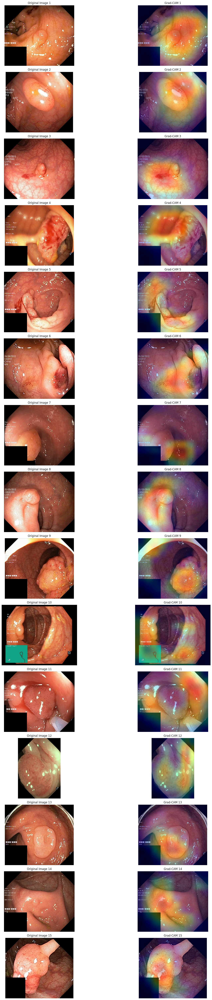

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
from PIL import Image as PILImage
from IPython.display import display
import matplotlib as mpl

# Function to preprocess the input image
def get_img_array(img_path, size):
    img = keras.utils.load_img(img_path, target_size=size)
    array = keras.utils.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    return array

# Function to generate Grad-CAM heatmap
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = keras.models.Model(
        model.inputs, [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)

        # If pred_index is None, use the predicted class with the highest probability
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))  # Pool over spatial dimensions (height, width)
    last_conv_layer_output = last_conv_layer_output[0]

    # Compute the heatmap: Weighted sum of the feature maps
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)  # Remove unnecessary dimensions
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)  # Normalize to [0, 1]
    return heatmap.numpy()

# Function to save and display Grad-CAM output
def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    img = keras.utils.load_img(img_path)
    img = keras.utils.img_to_array(img)

    # Convert the heatmap to a color map
    heatmap = np.uint8(255 * heatmap)
    jet = mpl.cm.get_cmap("jet")
    jet_colors = jet(np.arange(256))[:, :3]  # Extract RGB values
    jet_heatmap = jet_colors[heatmap]

    # Resize the heatmap to match the original image size
    jet_heatmap = keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.utils.img_to_array(jet_heatmap)

    # Superimpose the heatmap on the image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.utils.array_to_img(superimposed_img)

    # Save and display the resulting image
    superimposed_img.save(cam_path)
    display(PILImage.open(cam_path))

img_size = (512, 512)  # Adjust the image size based on your model's input size

# Loading and preprocessing the image
img_array = get_img_array(img_path, img_size)

model = keras.models.load_model('Kvasir Segmentation model.h5')

last_conv_layer_name= 'conv2d_18'

# Path to the images folder
images_folder = "/content/kvasir-seg/Kvasir-SEG/images/"
all_images = os.listdir(images_folder)
num_images = 15  # Change this to the desired number of images
random_images = random.sample(all_images, num_images)

# Set up the plot grid
plt.figure(figsize=(20, num_images * 4))
for i, image_name in enumerate(random_images):
    img_path = os.path.join(images_folder, image_name)

    # Load and preprocess the image
    img_array = get_img_array(img_path, img_size)

    # Get model predictions and Grad-CAM heatmap
    preds = model.predict(img_array, verbose=0)  # Suppress output by setting verbose=0
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

    # Generate the superimposed Grad-CAM image
    gradcam_img = display_gradcam(img_path, heatmap)

    # Display Original Image and Grad-CAM Image
    plt.subplot(num_images, 2, i * 2 + 1)
    plt.imshow(keras.utils.load_img(img_path))
    plt.axis("off")
    plt.title(f"Original Image {i+1}")

    plt.subplot(num_images, 2, i * 2 + 2)
    plt.imshow(gradcam_img)
    plt.axis("off")
    plt.title(f"Grad-CAM {i+1}")

plt.tight_layout()
plt.show()


### **Grad-Cam using Xception**

91884032/91884032 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
35363/35363 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Predicted class: [('n04149813', 'scoreboard', 143.42625)]


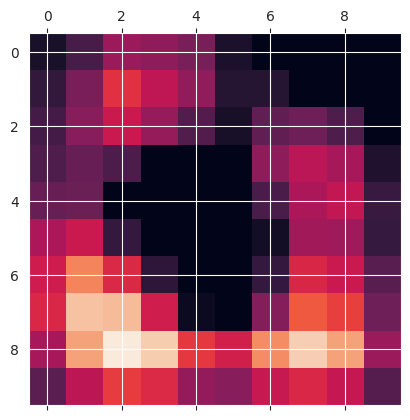

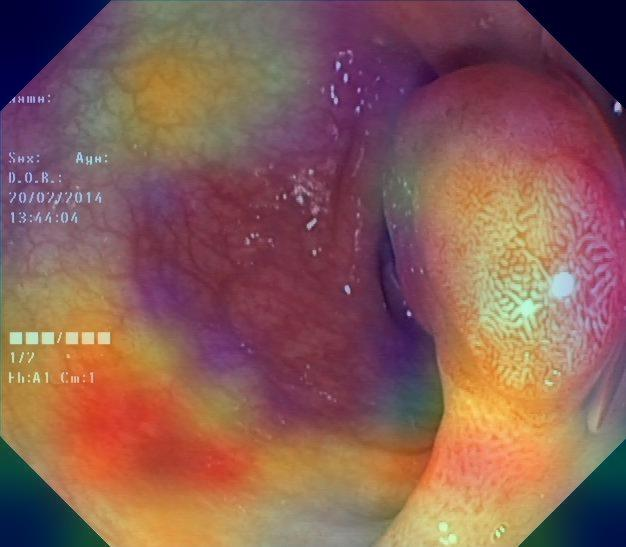

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
from PIL import Image as PILImage
from IPython.display import display
import matplotlib as mpl

# Function to preprocess the input image
def get_img_array(img_path, size):
    img = keras.utils.load_img(img_path, target_size=size)
    array = keras.utils.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    return array

# Function to generate Grad-CAM heatmap
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = keras.models.Model(
        model.inputs, [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)

        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

# Function to save and display Grad-CAM output
def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    img = keras.utils.load_img(img_path)
    img = keras.utils.img_to_array(img)

    heatmap = np.uint8(255 * heatmap)
    jet = mpl.cm.get_cmap("jet")
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    jet_heatmap = keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.utils.img_to_array(jet_heatmap)

    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.utils.array_to_img(superimposed_img)

    superimposed_img.save(cam_path)
    display(PILImage.open(cam_path))

img_path = "/content/Image.jpg"
last_conv_layer_name = "block14_sepconv2"
img_size = (299, 299)

# Loading and preprocessing the image
img_array = get_img_array(img_path, img_size)

model = keras.applications.xception.Xception(weights="imagenet")
model.layers[-1].activation = None

#Predicting and displaying the output
preds = model.predict(img_array)
print("Predicted class:", keras.applications.xception.decode_predictions(preds, top=1)[0])
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
plt.matshow(heatmap)
plt.show()
save_and_display_gradcam(img_path, heatmap)
